# Advanced Feature Overview
To give a full demonstration of the features of mlwhatif, we will use a relatively complex pipeline to classify helpful Amazon reviews. The pipeline is taken from the [argusyes](https://github.com/schelterlabs/arguseyes) project. The pipeline is implemented using native constructs from the popular pandas and scikit-learn libraries.

Let us start by looking at the pipeline source code.

In [1]:
from pygments import highlight
from pygments.lexers import PythonLexer
from pygments.formatters import HtmlFormatter
import IPython
import os
from mlwhatif.utils import get_project_root

DEMO_PY = os.path.join(str(get_project_root()), "demo", "feature_overview", "reviews.py")

with open(DEMO_PY) as pipline_file:
    code = pipline_file.read()

formatter = HtmlFormatter()
IPython.display.HTML('<style type="text/css">{}</style>{}'.format(
    formatter.get_style_defs('.highlight'),
    highlight(code, PythonLexer(), formatter)))

To now conduct our what-if analyses, we do not need to rewrite this pipeline file, we can use it directly as input for mlwhatif. Now, let us look at different analyses already implemented in mlwhatif.

## Data Corruption
Here, we test the robustness of our pipeline against different data quality errors. For each column, we can specify the type of errors to introduce. We can also specify different fractions of rows to corrupt.

In [2]:
from mlwhatif import PipelineAnalyzer
from mlwhatif.analysis._data_corruption import DataCorruption, CorruptionType
import warnings
warnings.filterwarnings('ignore')  # To keep the output readable


robustness = DataCorruption([('vine', CorruptionType.CATEGORICAL_SHIFT),
                             ('review_body', CorruptionType.BROKEN_CHARACTERS),
                             ('category', CorruptionType.CATEGORICAL_SHIFT),
                             ('total_votes', CorruptionType.MISSING_VALUES),
                             ('star_rating', CorruptionType.SCALING)],
                             corruption_percentages=[0.33, 0.66, 1.0])

analysis_result = PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(robustness) \
    .execute()

robustness_report = analysis_result.analysis_to_result_reports[robustness]

2022-10-12 18:58:29 INFO  Running instrumented original pipeline...
2022-10-12 18:58:29 INFO  Importing libraries and monkey-patching them... (Imports are slow if not in sys.modules cache yet!)
2022-10-12 18:58:29 INFO  ---RUNTIME: Importing and monkey-patching took 137.97926902770996 ms
2022-10-12 18:58:35 INFO  ---RUNTIME: Original pipeline execution took 5212.06259727478 ms (excluding imports and monkey-patching)
2022-10-12 18:58:35 INFO  Starting execution of 1 what-if analyses...
2022-10-12 18:58:35 INFO  Start plan generation for analysis DataCorruption...
2022-10-12 18:58:35 INFO  ---RUNTIME: Plan generation took 0.8242130279541016 ms
2022-10-12 18:58:35 INFO  Estimated runtime of original DAG is 5107.744455337524ms
2022-10-12 18:58:35 INFO  Performing Multi-Query Optimization
2022-10-12 18:58:35 INFO  Estimated unoptimized what-if runtime is 76616.16683006287ms
2022-10-12 18:58:35 INFO  Estimated optimised what-if runtime is 8147.1710205078125ms
2022-10-12 18:58:35 INFO  Estima

Let us start by looking at the report generated by the analysis. In the first column, we see the corruption that is being corrupted in the tested pipeline variant. In the second column, we see the fraction of currupted values in the column. In the third column, we see the utility score of that variant.

In the first row, we see the output from the original pipeline.

Here, find that our pipeline is relatively robust against the tested data quality issues, as long as they appear in one column at a time. The lowest utility score we see is for high fractions of missing values in the `star_rating` column. In the real world, this could be a candidate for data quality monitoring when deploying the pipeline in production.

In [3]:
robustness_report

,column,corruption_percentage,accuracy_score_corrupt_test_only_L109
0,None,NaN,0.883483
1,vine,0.33,0.880205
2,vine,0.66,0.880205
3,vine,1.00,0.880205
4,review_body,0.33,0.876116
5,review_body,0.66,0.870144
6,review_body,1.00,0.865762
7,category,0.33,0.880205
8,category,0.66,0.880205
9,category,1.00,0.880205


## Permutation Feature Importance
Next, we try looking at the importance of different features. By default, it will test the importance of all columns, but it is also possible to limit this to a subset of columns.

In [4]:
from mlwhatif.analysis._permutation_feature_importance import PermutationFeatureImportance

importance = PermutationFeatureImportance()

analysis_result = PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(importance) \
    .execute()

importance_report = analysis_result.analysis_to_result_reports[importance]

2022-10-12 18:58:45 INFO  Running instrumented original pipeline...
2022-10-12 18:58:45 INFO  Importing libraries and monkey-patching them... (Imports are slow if not in sys.modules cache yet!)
2022-10-12 18:58:45 INFO  ---RUNTIME: Importing and monkey-patching took 8.170843124389648 ms
2022-10-12 18:58:49 INFO  ---RUNTIME: Original pipeline execution took 4294.8713302612305 ms (excluding imports and monkey-patching)
2022-10-12 18:58:49 INFO  Starting execution of 1 what-if analyses...
2022-10-12 18:58:49 INFO  Start plan generation for analysis PermutationFeatureImportance...
2022-10-12 18:58:49 INFO  ---RUNTIME: Plan generation took 0.34499168395996094 ms
2022-10-12 18:58:49 INFO  Estimated runtime of original DAG is 4204.710006713867ms
2022-10-12 18:58:49 INFO  Performing Multi-Query Optimization
2022-10-12 18:58:49 INFO  Estimated unoptimized what-if runtime is 21023.550033569336ms
2022-10-12 18:58:49 INFO  Estimated optimised what-if runtime is 4950.9735107421875ms
2022-10-12 18:5

Now let us look at the report. The output follows the same structure all our analyses have, as seen the data corruption example. We see that the model does not rely on any single feature too much, but that `total_votes` seems to be the most important single feature.

In [5]:
importance_report

,column,accuracy_score_L109
0,None,0.883483
1,category,0.876375
2,vine,0.876375
3,star_rating,0.875791
4,total_votes,0.731330
5,review_body,0.868878


## Operator Impact
Next, we want to know the impact of different preprocessing operations in our pipeline. Currently, it tests the impact of both transformer and filter preprocessing operators.

In [6]:
from mlwhatif.analysis._operator_impact import OperatorImpact

preproc = OperatorImpact(test_selections=True)

analysis_result = PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(preproc) \
    .execute()

preproc_report = analysis_result.analysis_to_result_reports[preproc]

2022-10-12 18:58:54 INFO  Running instrumented original pipeline...
2022-10-12 18:58:54 INFO  Importing libraries and monkey-patching them... (Imports are slow if not in sys.modules cache yet!)
2022-10-12 18:58:54 INFO  ---RUNTIME: Importing and monkey-patching took 9.259939193725586 ms
2022-10-12 18:58:59 INFO  ---RUNTIME: Original pipeline execution took 4381.201982498169 ms (excluding imports and monkey-patching)
2022-10-12 18:58:59 INFO  Starting execution of 1 what-if analyses...
2022-10-12 18:58:59 INFO  Start plan generation for analysis OperatorImpact...
2022-10-12 18:58:59 INFO  ---RUNTIME: Plan generation took 5.925893783569336 ms
2022-10-12 18:58:59 INFO  Estimated runtime of original DAG is 4287.3334884643555ms
2022-10-12 18:58:59 INFO  Performing Multi-Query Optimization
2022-10-12 18:58:59 INFO  Estimated unoptimized what-if runtime is 22398.22973332465ms
2022-10-12 18:58:59 INFO  Estimated optimised what-if runtime is 9202.431435455364ms
2022-10-12 18:58:59 INFO  Estimat

We look at the results and find that none of the preprocessing steps we tested the impact of has a large impact. If, for example, one of the filters would cause a noticable change, we would need to worry that the selected data subset is not representative of the dataset as a whole.

In [7]:
preproc_report

,operator_type,operator_lineno,operator_code,strategy_description,accuracy_score_L109
0,None,NaN,None,None,0.883483
1,Transformer,65.0,RobustScaler(),passthrough,0.887508
2,Transformer,73.0,FunctionTransformer(another_imputer),replace nan with constant,0.884197
3,Transformer,73.0,FunctionTransformer(another_imputer),replace nan with constant,0.884197
4,Selection,37.0,reviews[reviews['review_date'] >= start_date.s...,drop the filter,0.878031
5,Selection,43.0,products_with_categories[\n products_wi...,drop the filter,0.882806


## Data Cleaning
Next, we want to know the impact of additional cleaning operations. For each column, we can specify which types of errors we expect, and mlwhatif will then automatically try all cleaning techniques it knows for that kind of error.

In [8]:
from mlwhatif.analysis._data_cleaning import DataCleaning, ErrorType

cleanlearn = DataCleaning({'category': ErrorType.CAT_MISSING_VALUES,
                           'vine': ErrorType.CAT_MISSING_VALUES,
                           'star_rating': ErrorType.NUM_MISSING_VALUES,
                           'total_votes': ErrorType.OUTLIERS,
                           'review_id': ErrorType.DUPLICATES,
                           None: ErrorType.MISLABEL
                         })

analysis_result = PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(cleanlearn) \
    .execute()

cleanlearn_report = analysis_result.analysis_to_result_reports[cleanlearn]

2022-10-12 18:59:10 INFO  Running instrumented original pipeline...
2022-10-12 18:59:10 INFO  Importing libraries and monkey-patching them... (Imports are slow if not in sys.modules cache yet!)
2022-10-12 18:59:10 INFO  ---RUNTIME: Importing and monkey-patching took 6.939888000488281 ms
2022-10-12 18:59:14 INFO  ---RUNTIME: Original pipeline execution took 4184.635162353516 ms (excluding imports and monkey-patching)
2022-10-12 18:59:14 INFO  Starting execution of 1 what-if analyses...
2022-10-12 18:59:14 INFO  Start plan generation for analysis DataCleaning...
2022-10-12 18:59:14 INFO  ---RUNTIME: Plan generation took 0.8819103240966797 ms
2022-10-12 18:59:14 INFO  Estimated runtime of original DAG is 4095.8428382873535ms
2022-10-12 18:59:14 INFO  Performing Multi-Query Optimization
2022-10-12 18:59:14 INFO  Estimated unoptimized what-if runtime is 90543.81275177002ms
2022-10-12 18:59:14 INFO  Estimated optimised what-if runtime is 13680.256843566895ms
2022-10-12 18:59:14 INFO  Estimat

Let us look at the output of the data cleaning analysis. We find that some of the outlier detection methods actually decrease the performance of our pipeline. Here, the only data cleaning option that yields in a noticable improvement, is the [cleanlab](https://github.com/cleanlab/cleanlab) label cleaning technique. Maybe we should take a close look at our labels and perform some more label cleaning.

In [9]:
cleanlearn_report

,corrupted_column,error,cleaning_method,accuracy_score_L109
0,None,None,None,0.883483
1,category,categorical missing values,delete,0.878972
2,category,categorical missing values,impute_cat_mode,0.871799
3,category,categorical missing values,impute_cat_dummy,0.873552
4,vine,categorical missing values,delete,0.880465
5,vine,categorical missing values,impute_cat_mode,0.876603
6,vine,categorical missing values,impute_cat_dummy,0.877219
7,star_rating,numerical missing values,delete,0.873032
8,star_rating,numerical missing values,impute_num_median,0.842394
9,star_rating,numerical missing values,impute_num_mean,0.858622


## Advanced features
Here, we repeatedly called mlwhatif on the pipeline source code file. Each time, we re-execute the original pipeline once to get the utility score for the pipeline variant without changes, and also for extracting the re-executable pipeline plan mlwhatif uses internally. Instead, we can directly execute our pipeline with mlwhatif once, and then reuse those results. We can even just always do this during pipeline development, if we know that we might want to run what-if analyses with mlwhatif afterward.

In [10]:
original_pipeline_info = PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .execute() \
    .dag_extraction_info

2022-10-12 18:59:36 INFO  Running instrumented original pipeline...
2022-10-12 18:59:36 INFO  Importing libraries and monkey-patching them... (Imports are slow if not in sys.modules cache yet!)
2022-10-12 18:59:36 INFO  ---RUNTIME: Importing and monkey-patching took 7.205009460449219 ms
2022-10-12 18:59:40 INFO  ---RUNTIME: Original pipeline execution took 4470.494031906128 ms (excluding imports and monkey-patching)
2022-10-12 18:59:40 INFO  Starting execution of 0 what-if analyses...
2022-10-12 18:59:40 INFO  Estimated runtime of original DAG is 4375.591278076172ms
2022-10-12 18:59:40 INFO  Performing Multi-Query Optimization
2022-10-12 18:59:40 INFO  Estimated unoptimized what-if runtime is 0ms
2022-10-12 18:59:40 INFO  Estimated optimised what-if runtime is 0ms
2022-10-12 18:59:40 INFO  Estimated optimisation runtime saving is 0ms
2022-10-12 18:59:40 INFO  ---RUNTIME: Multi-Query Optimization took 3.191232681274414 ms
2022-10-12 18:59:40 INFO  Executing generated plans
2022-10-12 18

Now that we have this DAG, we can directly use it for what-if analysis, and the execution will be faster.

In [11]:
_ = PipelineAnalyzer \
    .on_previously_extracted_pipeline(original_pipeline_info) \
    .add_what_if_analysis(PermutationFeatureImportance()) \
    .execute()

2022-10-12 18:59:40 INFO  Reusing DAG extraction results results from previously instrumented pipeline...
2022-10-12 18:59:40 INFO  Starting execution of 1 what-if analyses...
2022-10-12 18:59:40 INFO  Start plan generation for analysis PermutationFeatureImportance...
2022-10-12 18:59:40 INFO  ---RUNTIME: Plan generation took 0.1900196075439453 ms
2022-10-12 18:59:40 INFO  Estimated runtime of original DAG is 4375.591278076172ms
2022-10-12 18:59:40 INFO  Performing Multi-Query Optimization
2022-10-12 18:59:40 INFO  Estimated unoptimized what-if runtime is 21877.95639038086ms
2022-10-12 18:59:40 INFO  Estimated optimised what-if runtime is 5173.067092895508ms
2022-10-12 18:59:40 INFO  Estimated optimisation runtime saving is 16704.88929748535ms
2022-10-12 18:59:40 INFO  ---RUNTIME: Multi-Query Optimization took 15.253067016601562 ms
2022-10-12 18:59:40 INFO  Executing generated plans
2022-10-12 18:59:46 INFO  ---RUNTIME: Execution took 5937.341928482056 ms
2022-10-12 18:59:46 INFO  Done

This is especially useful when using the runtime estimation feature to tune the what-if analysis workload size in advance before triggering execution.

Example: How expensive would the data corruption analysis be, when also adding corruptions to the train-side?

After seeing the estimates, we know that we can try the effect of corruptions on the train-side without waiting too long.

In [12]:
robustness_with_train = DataCorruption([('vine', CorruptionType.CATEGORICAL_SHIFT),
                                        ('review_body', CorruptionType.BROKEN_CHARACTERS),
                                        ('category', CorruptionType.CATEGORICAL_SHIFT),
                                        ('total_votes', CorruptionType.MISSING_VALUES),
                                        ('star_rating', CorruptionType.SCALING)],
                                        corruption_percentages=[0.33, 0.66, 1.0],
                                       also_corrupt_train=True)

import logging
logging.disable(logging.CRITICAL) # Disable logging to have readable print output

print("With train corruptions")
PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(robustness_with_train) \
    .estimate() \
    .print_estimate()

print("Without train corruptions")
PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(robustness) \
    .estimate() \
    .print_estimate()

With train corruptions
Estimated runtime is 13457.939624786377ms.
Without train corruptions
Estimated runtime is 6365.489482879639ms.


## A small peak under the hood
Internally, mlwhatif extracts a re-executable plan of the original pipeline and uses multi-query optimization to optimize the execution of what-if analyses. Let us take a look at what this looks like for a simple example.
We will try to keep the what-if analysis very simple for readability.

In [13]:
from IPython.core.display import Image
EXAMPLE_ORIGINAL_PLAN_PATH = os.path.join(str(get_project_root()), "demo", "feature_overview",
                                                 "example-orig")
EXAMPLE_OPTIMIZED_PLAN_PATH = os.path.join(str(get_project_root()), "demo", "feature_overview",
                                                      "example-optimised")
simple_analysis = DataCorruption([('total_votes', CorruptionType.MISSING_VALUES),
                                  ('star_rating', CorruptionType.SCALING)],
                                 corruption_percentages=[0.8])

analysis_result = PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(simple_analysis) \
    .execute()
analysis_result.save_original_dag_to_path(EXAMPLE_ORIGINAL_PLAN_PATH)
analysis_result.save_optimised_what_if_dags_to_path(EXAMPLE_OPTIMIZED_PLAN_PATH)

The original pipeline plan extracted from the source code.

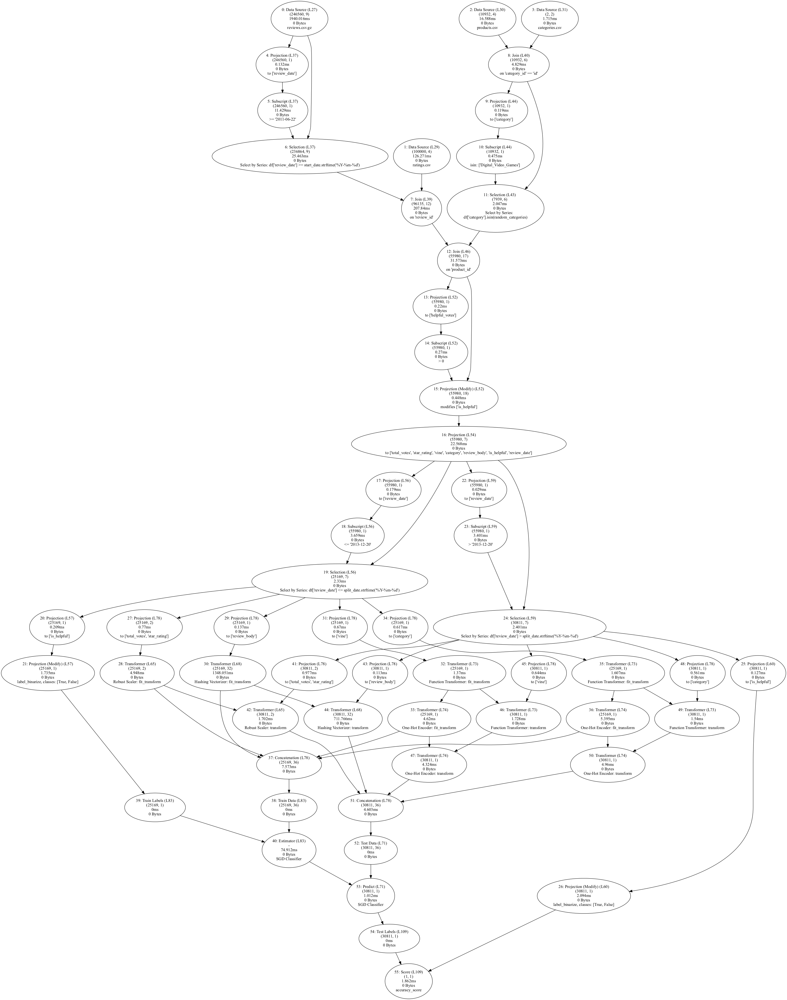

In [14]:
Image(filename=f"{EXAMPLE_ORIGINAL_PLAN_PATH}.png")

The optimised plan. Note how similar it is to the original DAG thanks to multi-query optimisation.

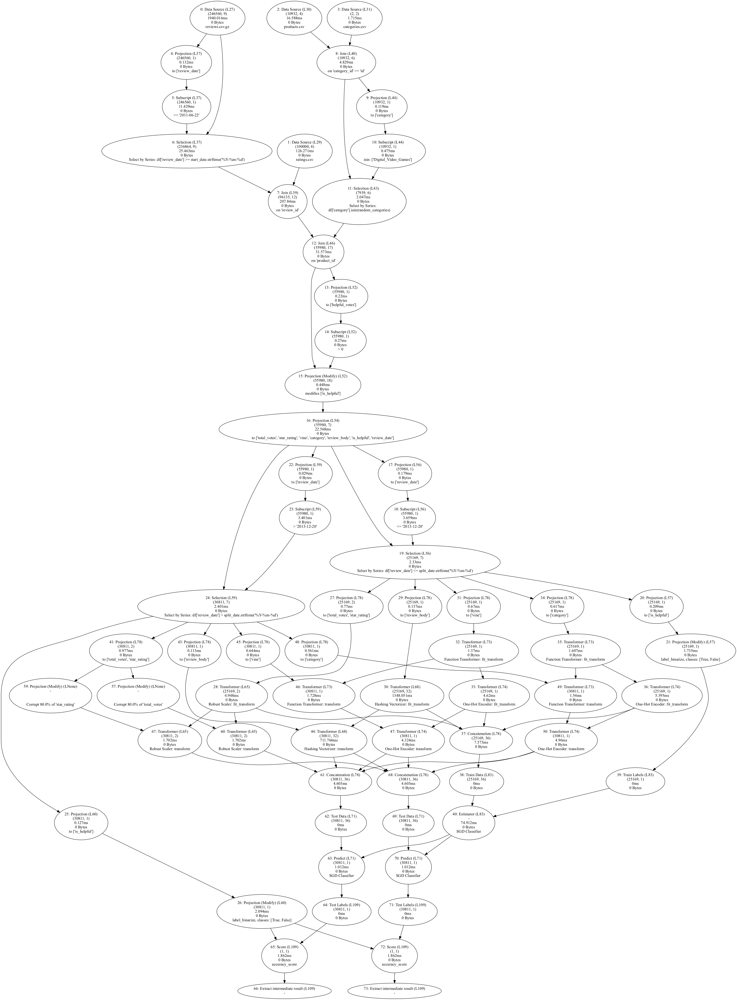

In [15]:
Image(filename=f"{EXAMPLE_OPTIMIZED_PLAN_PATH}.png")

However, these plans can become very complex quickly.

In [16]:
EXAMPLE_COMPLEX_PATH = os.path.join(str(get_project_root()), "demo", "feature_overview",
                                                      "example-complex")
PipelineAnalyzer \
    .on_pipeline_from_py_file(DEMO_PY) \
    .add_what_if_analysis(cleanlearn) \
    .estimate() \
    .save_optimised_what_if_dags_to_path(EXAMPLE_COMPLEX_PATH)
# Saving the large plan as image and loading it takes some time
Image(filename=f"{EXAMPLE_COMPLEX_PATH}.png")